# Sentiment Analysis on Disneyland Reviews

Ariadne Aizprua

13 Feb 2023

## Import libraries

In [172]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style('darkgrid')

%matplotlib inline

import re
import nltk
from nltk import word_tokenize, corpus
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
from nltk.sentiment import SentimentIntensityAnalyzer


from IPython.core.display import HTML
HTML("""<style> 
            .output_png { display: table-cell; text-align: center; vertical-align: middle; } 
     </style> """)

## Read Data

Name of the dataset: Disneyland reviews. 
The dataset includes 42,656 reviews of 3 Disneyland branches - Paris, California and Hong Kong, posted by visitors on Trip Advisor. Downloaded from kaggle.com

In [173]:
Disneyland = pd.read_csv('DisneylandReviews.csv', encoding='latin-1')
# Drop some columns leaving only rating and review text.
Disneyland.drop(columns=['Review_ID','Reviewer_Location', 'Branch', 'Year_Month'], inplace=True)
Disneyland

,Rating,Review_Text
0,4,If you've ever been to Disneyland anywhere you...
1,4,Its been a while since d last time we visit HK...
2,4,Thanks God it wasn t too hot or too humid wh...
3,4,HK Disneyland is a great compact park. Unfortu...
4,4,"the location is not in the city, took around 1..."
...,...,...
42651,5,i went to disneyland paris in july 03 and thou...
42652,5,2 adults and 1 child of 11 visited Disneyland ...
42653,5,My eleven year old daughter and myself went to...
42654,4,"This hotel, part of the Disneyland Paris compl..."


In [174]:
Disneyland.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42656 entries, 0 to 42655
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Rating       42656 non-null  int64 
 1   Review_Text  42656 non-null  object
dtypes: int64(1), object(1)
memory usage: 666.6+ KB


In [175]:
# check if we have NA
print(Disneyland.isnull().sum())

Rating         0
Review_Text    0
dtype: int64


## Focus in column Review_Text

We will preprocess the Text Data in the reviews using the clean_text_date().
The function will remove Handlers, URLs, Special Characters, Single Characters and Extra Spaces

In [176]:
Disneyland_reviews = Disneyland['Review_Text']

def clean_text_date(text):
    text = text.lower()

    # Replacing Handlers with Empty String
    text = re.sub('@[^\s]+','',text)

    # Replacing URLs with Empty String
    text = re.sub(r"http\S+", "",text)

    # Remove all the special characters
    text = ' '.join(re.findall(r'\w+', text))

    # Replacing Single Characters with Empty String
    text = re.sub(r'\s+[a-zA-Z]\s+', ' ', text)

    # Removing Extra Spaces
    text = re.sub(r'\s+', ' ', text, flags=re.I)
    
    return text

    
# Text Preprocessing
Disneyland_reviews = Disneyland_reviews.apply(lambda x : clean_text_date(x))

In [177]:
Disneyland_reviews

0        if you ve ever been to disneyland anywhere you...
1        its been while since last time we visit hk dis...
2        thanks god it wasn too hot or too humid when w...
3        hk disneyland is great compact park unfortunat...
4        the location is not in the city took around 1 ...
                               ...                        
42651    i went to disneyland paris in july 03 and thou...
42652    2 adults and 1 child of 11 visited disneyland ...
42653    my eleven year old daughter and myself went to...
42654    this hotel part of the disneyland paris comple...
42655    i went to the disneyparis resort in 1996 with ...
Name: Review_Text, Length: 42656, dtype: object

## Plotting a Histograms to see the Length (No. of words) Distribution of reviews

We use the word_tokenize from nltk on each review to get a list of Lengths.
Then using the Seaborn histplot we plot a histogram.

The histogram shows that the majority of reviews contain between 0 and 500 words with an average of 126 words.

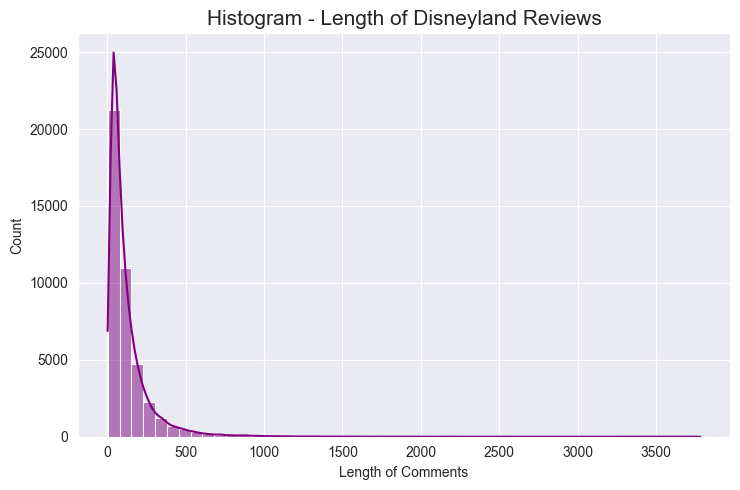

In [178]:
comments_length = [len(word_tokenize(text)) for text in Disneyland_reviews]

# Set the figure size
plt.rcParams["figure.figsize"] = [7.50, 5.00]
plt.rcParams["figure.autolayout"] = True

sns.histplot(comments_length, bins=50, kde=True, color='purple').set_xlabel("Length of Comments")
plt.title("Histogram - Length of Disneyland Reviews", fontsize=15)

plt.show()

In [179]:
# Average of comments length
import statistics
statistics.mean(comments_length)

126.19235277569392

## Removing Stop words

In [180]:
stop = stopwords.words('english')
Disneyland_reviews = Disneyland_reviews.apply(lambda x : " ".join(x for x in x.split() if x not in stop))

## Lemmatizing

The goal of lemmatization is to reduce a word to its root form. Using Lemmatization over Stemming, stemming causes words to lose their actual meaning.

In [181]:
lemmatizer = WordNetLemmatizer()
Disneyland_reviews = Disneyland_reviews.apply(lambda x : " ".join(lemmatizer.lemmatize(word) for word in x.split()))

## Most Common Words

The following graph shows the 50 most common words present in the Disneyland reviews. For instance, the top 5 are park, ride, time, day, and disney.

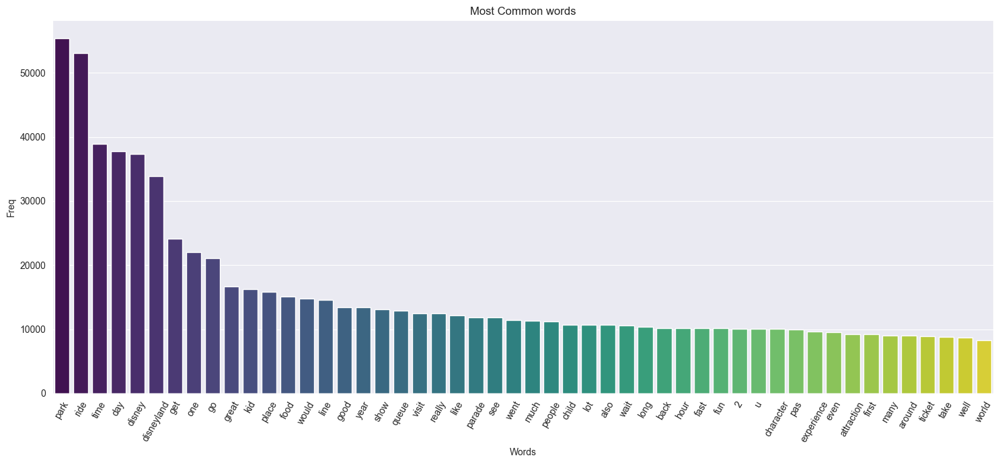

In [182]:
from collections import Counter
most_common = Counter(' '.join(Disneyland_reviews).split()).most_common(50)
mco_df = pd.DataFrame(most_common, columns = ['Words', 'Freq'])
plt.figure(figsize = (15,7))
sns.barplot(data = mco_df, x = 'Words', y = 'Freq', hue = 'Words', palette="viridis")
plt.title('Most Common words')
plt.xticks(rotation = 60)
plt.show()

## Word Cloud

The following Word Cloud shows the words that were most commonly used in the Dinseyland reviews. From the previous graph we saw that park was the most common word. In the Word Cloud park is also the most common word (biggest size) along with ride, time, day, and disney. Other frequent words are disneyland, really, get, great, food, year, firework, like among others.

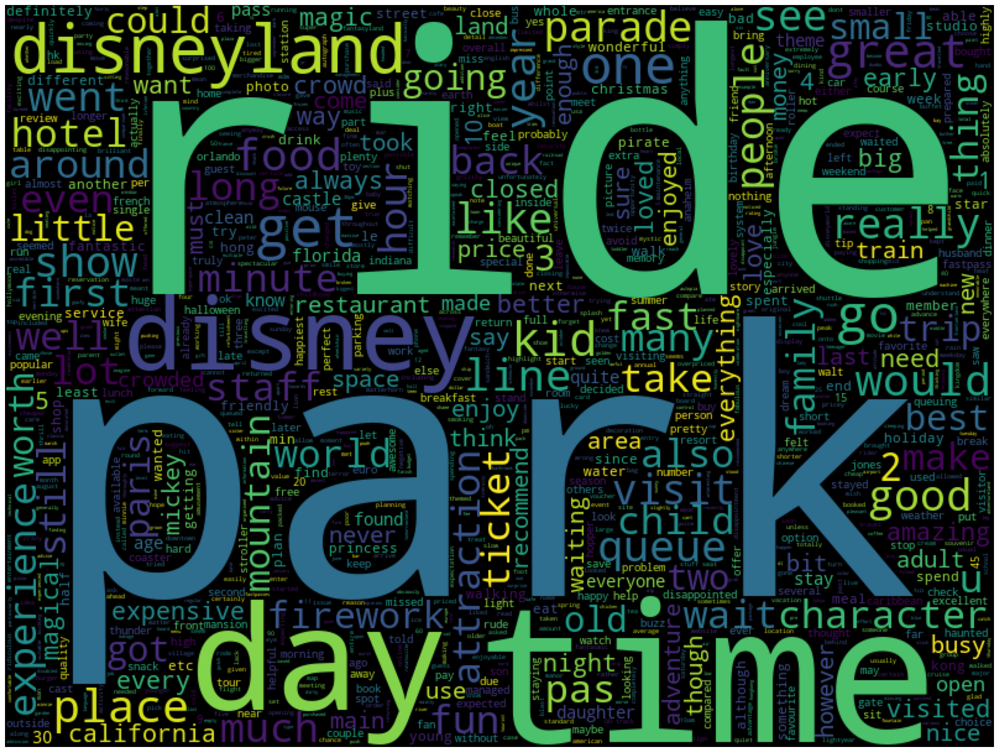

In [183]:
word_index = Counter(" ".join(Disneyland_reviews).split())
w_cloud = WordCloud(max_words = 1500, width = 800, height = 600).generate_from_frequencies(word_index, None)
plt.figure(figsize = (20,18))
plt.imshow(w_cloud)
plt.axis('off')
plt.show()

## Sentiment Analysis

Before creating a sentiment for each review, I checked how were the Dineyland reviews rated. The graph below shows that most of the reviews were good with a 5 star rating. 

Text(0.5, 1.0, 'Disneyland Reviews by Rating')

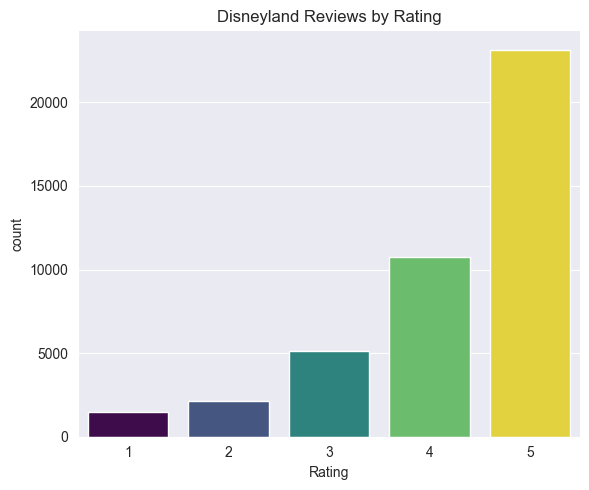

In [184]:
# Plot a graph of Disneyland reviews by rating

# Set the figure size
plt.rcParams["figure.figsize"] = [6.00, 5.00]
plt.rcParams["figure.autolayout"] = True

sns.countplot(Disneyland, x="Rating", hue="Rating", legend = False, palette='viridis').set_title("Disneyland Reviews by Rating")

## Sentiment Analysis Using SentimentIntensityAnalyzer from nltk.sentiment

1. Calling get_sentiment() on each Comment
2. Creating a new Column called 'Sentiment' and storing the respective sentiment
3. Using the Sentiment column to plot various graphs.

In [185]:
def get_sentiment(sia, text):
    if sia.polarity_scores(text)["compound"] > 0:
        return "Positive"
    elif sia.polarity_scores(text)["compound"] < 0:
        return "Negative"
    else:
        return "Neutral"

sia = SentimentIntensityAnalyzer()    
    
Disneyland_reviews_df = Disneyland_reviews.to_frame(name='Review_Text')
Disneyland_reviews_df['Sentiment'] = Disneyland_reviews_df['Review_Text'].apply(lambda x : get_sentiment(sia, x))
Disneyland_reviews_df

,Review_Text,Sentiment
0,ever disneyland anywhere find disneyland hong ...,Positive
1,since last time visit hk disneyland yet time s...,Positive
2,thanks god hot humid visiting park otherwise w...,Positive
3,hk disneyland great compact park unfortunately...,Positive
4,location city took around 1 hour kowlon kid li...,Positive
...,...,...
42651,went disneyland paris july 03 thought brillian...,Positive
42652,2 adult 1 child 11 visited disneyland paris be...,Positive
42653,eleven year old daughter went visit son london...,Positive
42654,hotel part disneyland paris complex wonderful ...,Positive


## Plotting a Bar Graph for Sentiment Counts

From the previous chart, Disneyland Reviews by Rating we saw that the majority of reviews were good. The polarity chart below confirm that in fact, most of the reviews are positive (almost 40,000). The negative reviews are around 3,000, and the neutral were only a few. 

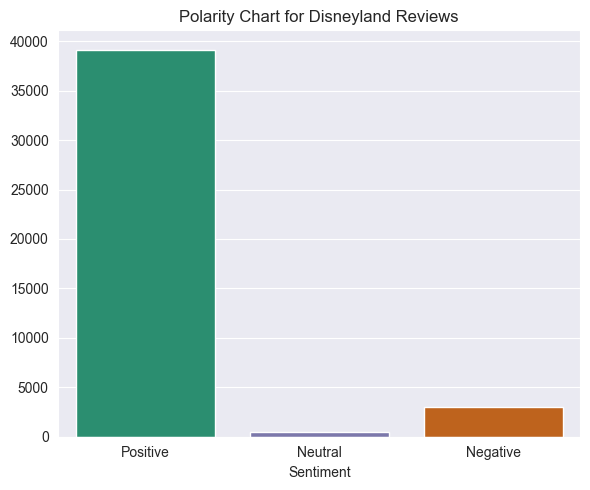

In [186]:
order = ['Positive', 'Neutral', 'Negative']

xs = Disneyland_reviews_df['Sentiment'].value_counts().index
ys = Disneyland_reviews_df['Sentiment'].value_counts().values
sns.barplot(x=xs, y=ys, order=order, hue=xs, legend=False, palette='Dark2').set_title("Polarity Chart for Disneyland Reviews")


plt.show()

## Word Cloud for Different Sentiment

Next, I created three word clouds. One for each sentiment.

In [187]:
# Select words by sentiment
pos_rev = Disneyland_reviews_df[Disneyland_reviews_df['Sentiment'].isin(['Positive'])]
neg_rev = Disneyland_reviews_df[Disneyland_reviews_df['Sentiment'].isin(['Negative'])]
neu_rev = Disneyland_reviews_df[Disneyland_reviews_df['Sentiment'].isin(['Neutral'])]

### Word Cloud for Positive Sentiment

Below we have a word cloud for the positive sentiment. Some of the common words are park, ride, disney, time, day, year, people, parade, food, attraction, experience, among others.

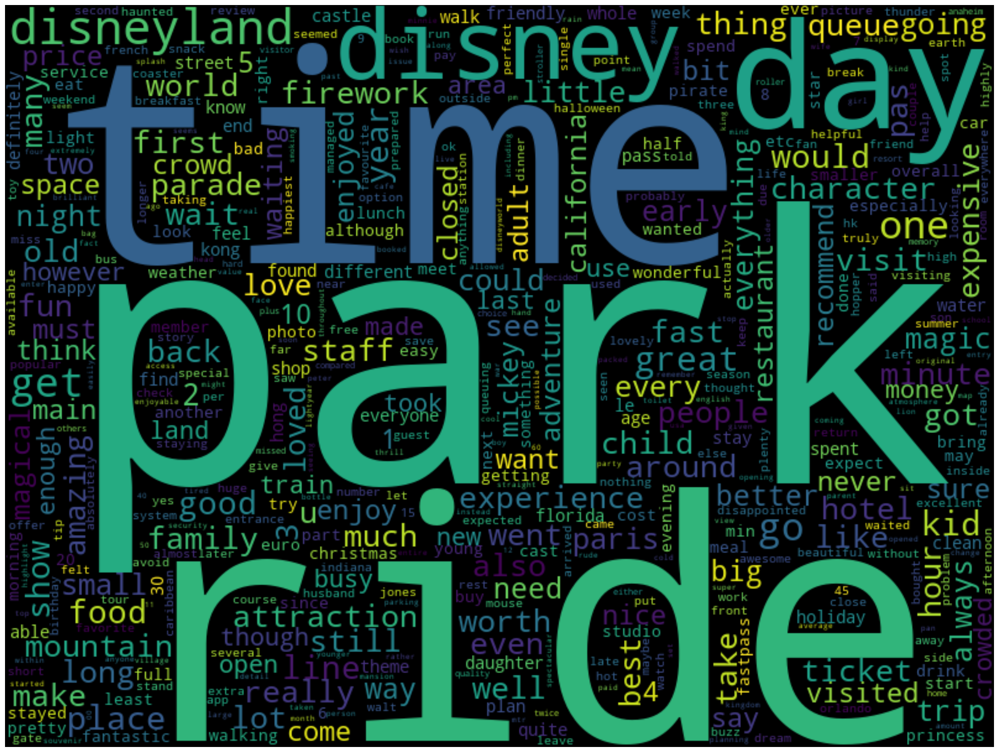

In [188]:
pos_idx = Counter(" ".join(pos_rev['Review_Text']).split())
w_cloud = WordCloud(max_words = 500, width = 800, height = 600).generate_from_frequencies(pos_idx, None)
plt.figure(figsize = (20,18))
plt.imshow(w_cloud, interpolation = 'bilinear')
plt.axis('off')
plt.show()

### Word Cloud for Negative Sentiment

The word cloud for negative sentiment includes the words, park, time, ride, queue, disneyland, food, year, closed, minute, ticket, staff, wait, expensive, hour. 

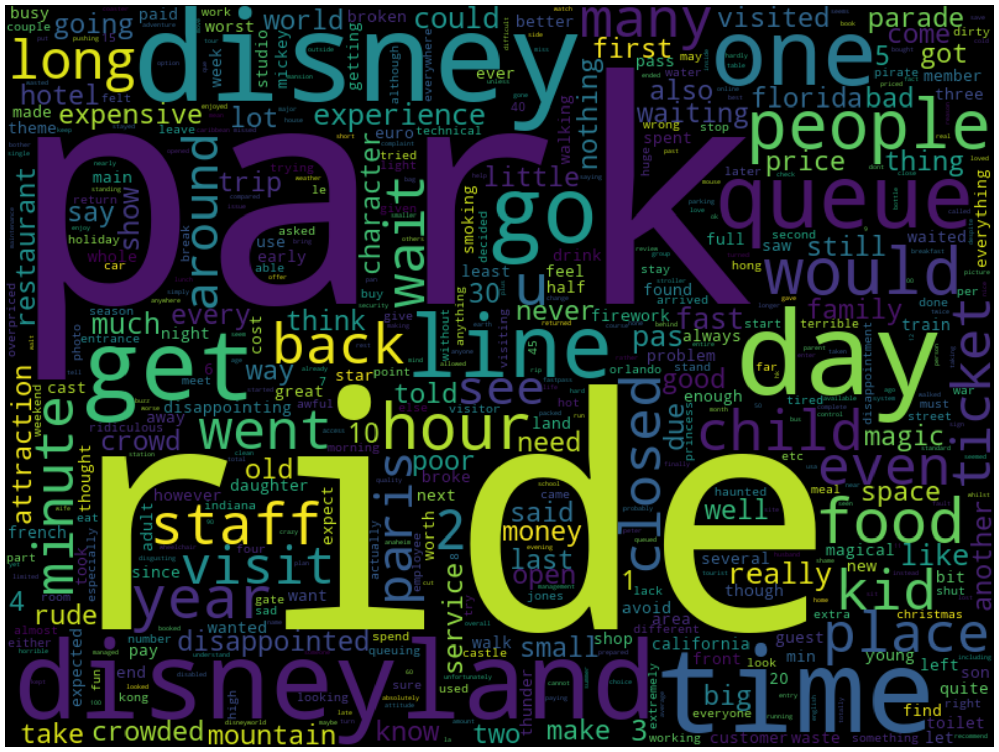

In [189]:
neg_idx = Counter(" ".join(neg_rev['Review_Text']).split())
w_cloud = WordCloud(max_words = 500, width = 800, height = 600).generate_from_frequencies(neg_idx, None)
plt.figure(figsize = (20,18))
plt.imshow(w_cloud, interpolation = 'bilinear')
plt.axis('off')
plt.show()

### Word Cloud for Neutral Sentiment

The neutral sentiment word cloud includes the words ride, park, disneyland, time, disney, crowded, place, line, people, ticket among others. 

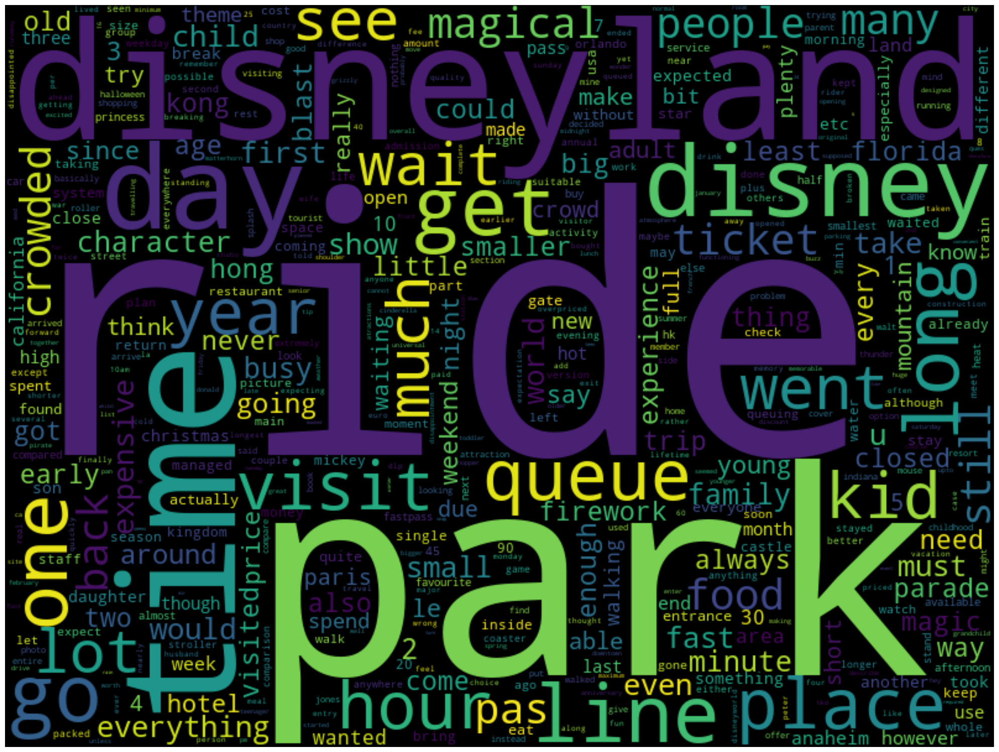

In [194]:
pos_idx = Counter(" ".join(neu_rev['Review_Text']).split())
w_cloud = WordCloud(max_words = 500, width = 800, height = 600).generate_from_frequencies(pos_idx, None)
plt.figure(figsize = (20,18))
plt.imshow(w_cloud, interpolation = 'bilinear')
plt.axis('off')
plt.show()

## Emotion Chart

To create an emotion chart I am using NRCLex library. This library will measure emotional affect from a body of text. Emotional affects measured include the following: fear, anger, anticipation, trust, surprise, positive, negative, sadness, disgust, and joy.

In [191]:
from nrclex import NRCLex

In [192]:
def emotion(x):
    text = NRCLex(x)
    if text.top_emotions[0][1] == 0.0:
        return "no emotion"
    else:
        return text.top_emotions[0][0]
    
Disneyland_reviews_df['Emotion'] = Disneyland_reviews_df['Review_Text'].apply(emotion)
Disneyland_reviews_df.head()

,Review_Text,Sentiment,Emotion
0,ever disneyland anywhere find disneyland hong ...,Positive,positive
1,since last time visit hk disneyland yet time s...,Positive,positive
2,thanks god hot humid visiting park otherwise w...,Positive,positive
3,hk disneyland great compact park unfortunately...,Positive,positive
4,location city took around 1 hour kowlon kid li...,Positive,anger


### Plotting an Emotion Chart

From the Emotion chart below, we see that most of the reviews were categorize under the positive emotion, followed by anticipation, trust, negative, surprise, fear, anger and no emotion. Sadness, disgust, and joy emotions weren't present in the reviews according to the NRCLex library.

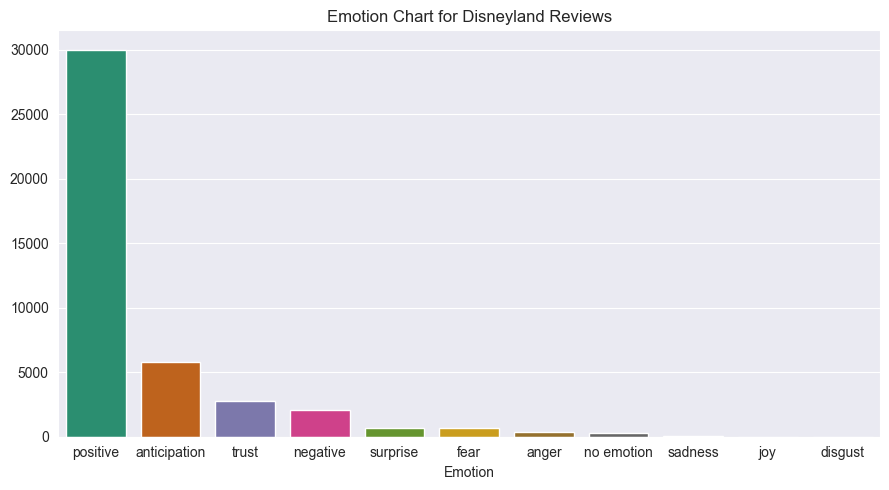

In [193]:
# Set the figure size
plt.rcParams["figure.figsize"] = [9.00, 5.00]
plt.rcParams["figure.autolayout"] = True

order = ['positive', 'anticipation', 'trust', 'negative', 'surprise', 'fear', 'anger', 'no emotion', 'sadness', 'joy', 'disgust']
xs = Disneyland_reviews_df['Emotion'].value_counts().index
ys = Disneyland_reviews_df['Emotion'].value_counts().values
sns.barplot(x=xs, y=ys, order=order, hue=xs, legend=False, palette='Dark2').set_title("Emotion Chart for Disneyland Reviews")

plt.show()

## Conclusion

Sentiment analysis is text analytics with purpose. It draws upon positive and negative words sets (lexicons, dictionaries) that convey human emotion or feeling. In this project, I analyzed Disneyland reviews in different ways, using Word Clouds, sentiment, and emotion analysis. All of them agreed that visitors mostly had a positive experience in Disneyland. They clearly like the parks, rides, and had a good time. There might be some issues with tickets, crowdedness, staff, and cost. It would be interesting to create an individual analysis per location to get better insights. 

## Resources
Disneyland reviews dataset
https://www.kaggle.com/datasets/arushchillar/disneyland-reviews?resource=download

https://www.kaggle.com/code/sprakshith/beginner-s-guide-to-sentiment-analysis

https://www.kaggle.com/code/johnybhiduri/become-nlp-expert

https://www.kaggle.com/code/datatattle/lexicon-sentiment-analysis-unsupervised